# Plots

- Evaluations should be performed over:
    - [1...10] seed values per epsilon (over which will be averaged).
    - Epsilons of [0.5, 0.75, 1, 1.5, 2, 3, 4.5, 6.5, 9, 12, 16, 20]

In [1]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import scipy
import pandas as pd
from pprint import pprint
from glob import glob
import pickle
from tqdm import tqdm
import os
from scipy.stats import wasserstein_distance
pd.set_option('display.width', 200)

EPS = [0.5, 0.75, 1, 1.5, 2, 3, 4.5, 6.5, 9, 12, 16, 20]
DATAS = {
    "Facebook": {
        "feature_file": "feature_matrix_50_densest_binary-ish.txt",
        "target_file": "",
        "order": 0,
    },
    "LastFM": {
        "feature_file": "feature_matrix_50_highest_entropy.pkl",
        "target_file": "targets_reduced_5.txt",
        "order": 1,
    },
    "GitHub": {
        "feature_file": "feature_matrix_50_highest_entropy.pkl",
        "target_file": "targets.txt",
        "order": 2,
    },
    "Brightkite": {
        "feature_file": "feature_matrix_top_50.txt",
        "target_file": "",
        "order": 3,
    }
}
METHODS = {
    "PrivCom": {
        "directory": "Zhang20 - PrivCom/result/",
        "num_trials": 10,
        "order": 0,
    },
    "pi_v": {
        "directory": "Jian23 - pi_v, pi_e/node_result/",
        "num_trials": 10,
        "order": 1,
    },
    "pi_e": {
        "directory": "Jian23 - pi_v, pi_e/edge_result/",
        "num_trials": 10,
        "order": 2,
    },
    "PrivDPR": {
        "directory": "Zhang25 - PrivDPR/result/",
        "num_trials": 10,
        "order": 4
    }
}
COLOURS = plt.rcParams['axes.prop_cycle'].by_key()['color']

font_size = 14
ticks_fontsize = font_size - 2.5
legend_font_size = font_size - 2
title_font_size = font_size + 1
settings = {
    'font.size': font_size,
    'font.family': "serif", 
    "mathtext.fontset": "dejavuserif",  #cm
    'figure.titlesize': title_font_size,
    'figure.autolayout': True,
    'legend.fontsize': legend_font_size,
    'axes.titlesize': font_size,
    'axes.labelsize': font_size - 1,
    'ytick.labelsize': ticks_fontsize,
    'xtick.labelsize': ticks_fontsize,
    'hatch.linewidth': 0.8,
    'xtick.minor.pad': 1,
    'axes.labelpad': 3,
    'axes.grid': True,
    'grid.linestyle': '--',
    'grid.linewidth': 0.4,
    'grid.alpha': 0.8,
    'axes.axisbelow': True,
    'legend.framealpha': 1,
    'legend.edgecolor': 'black',
    'legend.fancybox': False,
    'legend.handletextpad': 0.2,
    'legend.columnspacing': 0.5,
    'figure.dpi': 800,
    'figure.max_open_warning': 0,
    'legend.facecolor': 'white',
    'lines.linewidth': 1,
    'errorbar.capsize': 3,  
    'lines.markeredgewidth': 0.5, 
    'lines.markersize': 3,
    'axes.formatter.limits':  [-3, 3],
}
plt.rcParams.update(settings)

In [2]:
import warnings
warnings.filterwarnings(
    "ignore",
    message="The number of unique classes is greater than 50% of the number of samples.*",
    category=UserWarning,
    module="sklearn.metrics.cluster._supervised"
)


def compute_error_dicts(dataset, methods):
    with open(f"./Unprivate/{dataset}.pkl", 'rb') as f:
        O = pickle.load(f) # dict
    methods.sort(key=lambda x: METHODS[x]["order"])
    print(methods)
    for method in methods:
        if dataset in ["GitHub", "Brightkite"] and method in ["PrivCom"]: continue # EXCLUSION
        results = {
            "local": dict(),
            "global": dict(),
            "utility": dict(),
        }
        for eps in EPS:
            with open(f"./Measurements/{dataset}/{method}_eps{eps}.pkl", 'rb') as f:
                G = pickle.load(f)
            for metric in G["local"].keys(): # local: wasserstein distances
                if metric not in results["local"].keys():
                    results["local"][metric] = list()
                x = []
                for i in range(METHODS[method]["num_trials"]):
                    dist = [v for v in G["local"][metric][i] if (not np.isnan(v)) and (not np.isinf(v))]
                    if dist:
                        x.append(wasserstein_distance([v for v in O["local"][metric] if (not np.isnan(v)) and (not np.isinf(v))], dist))
                avg = sum(x) / len(x)
                results["local"][metric].append(avg)
            for metric in G["global"].keys(): # global: absolute error, except harmonic diameter.
                if metric not in results["global"].keys():
                    results["global"][metric] = list()
                x = []
                for i in range(METHODS[method]["num_trials"]):
                    number = G["global"][metric][i]
                    if np.isnan(number) or np.isinf(number): continue
                    if metric in ["Harmonic Diameter", "Number of Nodes", "Number of Edges"]: # relative
                        #avg += (abs(O["global"][metric] - number) / abs(O["global"][metric])) / METHODS[method]["num_trials"]
                        x.append(abs(O["global"][metric] - number) / abs(O["global"][metric]))
                    else: # absolute
                        #avg += (abs(O["global"][metric] - number)) / METHODS[method]["num_trials"]
                        x.append(abs(O["global"][metric] - number))
                avg = sum(x) / len(x)
                results["global"][metric].append(avg)
            if method in ["pi_v", "pi_e"]: continue
            for metric in G["utility"].keys(): # absolute error
                if metric == "Influence Maximisation": continue # not evaluated
                for m2 in G["utility"][metric].keys():
                    label = metric + " " + m2
                    label = label.replace("ROC AUC", "AUROC")
                    if label not in results["utility"].keys():
                        results["utility"][label] = list()
                    x = []
                    for i in range(METHODS[method]["num_trials"]):
                        x.append(abs(O["utility"][metric][m2] - G["utility"][metric][m2][i]))
                    avg = sum(x) / len(x)
                    results["utility"][label].append(avg)
        with open(f"./Results/Errors/dicts/{dataset}_{method}.pkl", 'wb') as f:
            pickle.dump(results, f)


def tabulate_error_dicts(dataset, methods=[method for method in METHODS.keys()]):
    big_table = dict()
    methods.sort(key=lambda x: METHODS[x]["order"])
    for method in methods:
        if dataset in ["GitHub", "Brightkite"] and method in ["PrivCom"]: continue # EXCLUSION
        with open(f"./Results/Errors/dicts/{dataset}_{method}.pkl", 'rb') as f:
            result = pickle.load(f)
        for metric in result["local"].keys():
            if metric not in big_table.keys():
                big_table[metric] = {'epsilon': [eps for eps in EPS]}
            big_table[metric][method] = result["local"][metric]
        for metric in result["global"].keys():
            if metric not in big_table.keys():
                big_table[metric] = {'epsilon': [eps for eps in EPS]}
            big_table[metric][method] = result["global"][metric]
        for metric in result["utility"].keys():
            if metric not in big_table.keys():
                big_table[metric] = {'epsilon': [eps for eps in EPS]}
            big_table[metric][method] = result["utility"][metric]
        
    with open(f"./Results/Errors/dicts/{dataset}.pkl", 'wb') as f:
        pickle.dump(big_table, f)
    for k in big_table.keys():
        #print(big_table[k])
        df = pd.DataFrame(big_table[k])
        #print(k)
        #print(df)
        df.to_csv(f"./Results/Errors/csvs/{dataset}_{k.replace(' ', '_')}.csv", index=False)
        #print()



In [3]:
for dataset in ["Facebook", "LastFM", "GitHub", "Brightkite"]:
    compute_error_dicts(dataset, [method for method in METHODS.keys()]) # 

for dataset in ["Facebook", "LastFM", "GitHub", "Brightkite"]:
    tabulate_error_dicts(dataset, [method for method in METHODS.keys()])

['PrivCom', 'pi_v', 'pi_e', 'PrivDPR']
['PrivCom', 'pi_v', 'pi_e', 'PrivDPR']
['PrivCom', 'pi_v', 'pi_e', 'PrivDPR']
['PrivCom', 'pi_v', 'pi_e', 'PrivDPR']


In [4]:
TITLE_IDS = {
    "Number of Nodes Error": "(a)",
    "Number of Edges Error": "(b)",
    "Degree Distribution Error": "(c)",
    "Clustering Coefficient Distribution Error": "(d)",
    "Betweenness Centrality Distribution Error": "(e)",
    "Closeness Centrality Distribution Error": "(f)",
    "Density Error": "(g)",
    "Harmonic Diameter Error": "(h)",
    "Assortativity Error": "(i)",
    "Modularity Error": "(j)",
    #"Transitivity Error": "(k)",
    "Link Prediction AUROC Error": "(k)",
    #"Link Prediction Average Precision Error": "(m)",
    "Node Classification\nF1 Score Error (LastFM)": "(l)",
}

def plot_errors(datasets=[dataset for dataset in DATAS.keys()], with_label_ids=False):
    plots = dict()
    plot_size = 3
    datasets.sort(key=lambda x: DATAS[x]["order"])
    for i, dataset in enumerate(datasets):
        with open(f"./Results/Errors/dicts/{dataset}.pkl", 'rb') as f:
            big_table = pickle.load(f)
        for metric in big_table.keys():
            idx = i
            if "Link Prediction" in metric:
                if dataset in ["GitHub", "Brightkite"]: continue
                n_cols = 2
            elif "Node Classification" in metric:
                if dataset not in ["LastFM"]: continue
                n_cols = 1
                idx -= 1
            else:
                n_cols = 4
            if metric not in plots.keys():
                if n_cols == 1:
                    fig, axes = plt.subplots(1, n_cols, figsize=(plot_size*n_cols, plot_size), squeeze=False)
                    plots[metric] = [None, None]
                    plots[metric][0] = fig
                    plots[metric][1] = axes.flatten()
                    title = metric[:19] + '\n' + metric[20:] + " Error" + f" ({dataset})"
                else:
                    plots[metric] = plt.subplots(1, n_cols, figsize=(plot_size*n_cols-1, plot_size))
                    title = f"{metric} Error"
                plots[metric][0].suptitle(title)
            all_y_vals = []
            for method in sorted([m for m in big_table[metric].keys() if m != 'epsilon'], key=lambda x: METHODS[x]["order"]):
                label = method.replace("pi_v", r"$\pi_v$").replace("pi_e", r"$\pi_e$")
                plots[metric][1][idx].plot(EPS, big_table[metric][method], label=label, marker='o', color=COLOURS[METHODS[method]['order']])
                all_y_vals += big_table[metric][method]
            if n_cols > 1:
                plots[metric][1][idx].set_title(dataset)
            plots[metric][1][idx].set_ylim(bottom=0)
            plots[metric][1][idx].set_xscale("log", base=np.e)
            plots[metric][1][idx].set_xlabel(r"Privacy Budget ($\epsilon$)")
            plots[metric][1][idx].set_xlim((min(EPS),max(EPS)))
            plots[metric][1][idx].set_xticks(EPS)
            plots[metric][1][idx].set_xticklabels(EPS, rotation=90)
            plots[metric][1][idx].ticklabel_format(style='sci', axis='y', scilimits=(-3, 3), useOffset=False)
            plots[metric][1][idx].grid(True, which='both', linewidth=0.4, alpha=0.8, linestyle="--", zorder=0)
    #"""
    for metric in plots.keys():
        if with_label_ids:
            title = plots[metric][0]._suptitle.get_text()
            title = TITLE_IDS.get(title, "(?)") + " " + title
            plots[metric][0].suptitle(title)
        plots[metric][0].tight_layout(pad=0.25,h_pad=0, w_pad=0.4)
        if with_label_ids:
            plots[metric][0].savefig(f"./Results/Errors/plots/{metric}_w_id.pdf")
        else:
            plots[metric][0].savefig(f"./Results/Errors/plots/{metric}.pdf")
            with open("./Results/Errors/plots/plots_dict.pkl", 'wb') as f:
                pickle.dump(plots, f)
    #"""
    legend_fig = plt.figure(figsize=(1, 1))
    handles, labels = plots["Density"][1][0].get_legend_handles_labels()
    legend = legend_fig.legend(handles=handles, labels=labels, ncol=1, loc='center',frameon=False)
    legend_fig.canvas.draw()
    bbox = legend.get_window_extent().transformed(legend_fig.dpi_scale_trans.inverted())
    legend_fig.tight_layout(pad=0,h_pad=0, w_pad=0)
    #legend_fig.savefig("legend.png", bbox_inches=bbox)
    legend_fig.savefig("legend_4x1.pdf", bbox_inches=bbox)


def plot_ccdf_distributions(datasets=[dataset for dataset in DATAS.keys()], log=True):
    def ccdf(data, xvals):
        data = np.sort(data)
        return np.array([np.count_nonzero(data > x) / len(data) for x in xvals])
    plots = dict()
    plot_size = 3
    for i, epsilon in enumerate(EPS):
        i = i % (len(EPS) // 2)
        for j, dataset in tqdm(enumerate(datasets), desc=f"Epsilon {epsilon}; Dataset"):
            j *= 2
            if epsilon in EPS[len(EPS)//2:]:
                j += 1
            #print(i, j, epsilon, dataset)
            #"""
            with open(f"./Unprivate/{dataset}.pkl", 'rb') as f:
                d = pickle.load(f)
            for metric in d["local"].keys():
                if metric not in plots.keys():
                    plots[metric] = plt.subplots(len(EPS) // 2, 4 * 2, figsize=(plot_size*8+1, plot_size*len(EPS)//2))
                plots[metric][1][i][j].set_title(f"{dataset}, $\\epsilon = {epsilon}$")
                d["local"][metric] = [v for v in d["local"][metric] if (not np.isnan(v)) and (not np.isinf(v))]
                len_data = len(d["local"][metric])
                if log:
                    plots[metric][1][i][j].loglog(sorted(d["local"][metric]), 1.0 - np.arange(1, len_data+1) / len_data, color='black', linestyle='--', label="Non-Private")
                else:
                    plots[metric][1][i][j].plot(sorted(d["local"][metric]), 1.0 - np.arange(1, len_data+1) / len_data, color='black', linestyle='--', label="Non-Private")
            for method in sorted([m for m in METHODS.keys()], key=lambda x: METHODS[x]["order"]):
                if dataset in ["GitHub", "Brightkite"] and method in ["PrivCom"]: continue # EXCLUSION
                with open(f"./Measurements/{dataset}/{method}_eps{epsilon}.pkl", 'rb') as f:
                    d = pickle.load(f)
                for metric in d["local"].keys():
                    x = np.unique(np.concatenate(d["local"][metric]))
                    x = [v for v in x if (not np.isnan(v)) and (not np.isinf(v))]
                    mean_ccdf = np.mean(np.array([ccdf(trial, x) for trial in d["local"][metric]]), axis=0)
                    plots[metric][1][i][j].loglog(x, mean_ccdf, label=f"{method}*" if method == "ALJ" else method, linewidth=0.8, color=COLOURS[METHODS[method]['order']])
                    axis_label = metric.replace("Distribution", "").strip()
                    plots[metric][1][i][j].set_xlabel(axis_label)
                    plots[metric][1][i][j].grid(True, which='both', linewidth=0.4, alpha=0.8, linestyle="--")
                    plots[metric][1][i][j].set_ylim(top=1)
                    if j == len(datasets)-1:
                        plots[metric][1][i][0].set_ylabel(f"$P({axis_label} > x)$")
                        #handles, labels = plots[metric][1][i][0].get_legend_handles_labels()
                        #plots[metric][1][i][-1].legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5))
            #"""
    for metric in plots.keys():
        plots[metric][0].tight_layout(pad=0.25, h_pad=0.5, w_pad=0)
        #plots[metric][0].savefig(f"./Results/Distribution Plots/{metric}.png")
        plots[metric][0].savefig(f"./Results/Distribution Plots/{metric}.pdf")
    with open(f"./Results/Distribution Plots/plots_dict.pkl", 'wb') as f:
        pickle.dump(plots, f)


def tabulate_and_plot_measurements(datasets=[dataset for dataset in DATAS.keys()]):
    plots =  dict()
    plot_size = 3
    big_table = {dataset: dict() for dataset in datasets}
    for i, dataset in enumerate(datasets):
        with open(f"./Unprivate/{dataset}.pkl", 'rb') as f:
            d = pickle.load(f)
        with open(f"../../Data/{dataset}/nx_adj.pkl", 'rb') as f:
            g = pickle.load(f)
            d["global"]["Number of Nodes"] = g.number_of_nodes()
            d["global"]["Number of Edges"] = g.number_of_edges()
            del g
        for metric in [m for m in d["global"].keys()]:# + ["Number of Nodes", "Number of Edges"]:
            if metric not in plots.keys():
                plots[metric] = plt.subplots(1, 4, figsize=(plot_size*4-1, plot_size))
                plots[metric][0].suptitle(metric)
            if metric not in big_table[dataset].keys():
                big_table[dataset][metric] = {'epsilon':EPS}
                big_table[dataset][metric]['Non-Private'] = [d["global"][metric] for _ in EPS]
            plots[metric][1][i].set_title(dataset)
            plots[metric][1][i].plot(EPS, [d["global"][metric] for _ in EPS], color='black', linestyle='--', label='Non-Private', zorder=3)
            #all_y_vals = []
            for method in sorted([m for m in METHODS.keys()], key=lambda x: METHODS[x]["order"]):
                if dataset in ["GitHub", "Brightkite"] and method in ["PrivCom"]: continue # EXCLUSION
                y = []
                for epsilon in EPS:
                    with open(f"./Measurements/{dataset}/{method}_eps{epsilon}.pkl", 'rb') as f:
                        r = pickle.load(f)
                    x = []
                    for j in range(METHODS[method]["num_trials"]):
                        number = r["global"][metric][j]
                        if np.isnan(number) or np.isinf(number): continue
                        #avg += r["global"][metric][j] / METHODS[method]["num_trials"]
                        x.append(number)
                    avg = sum(x) / len(x)
                    y.append(avg)
                label = method.replace("pi_v", r"$\pi_v$").replace("pi_e", r"$\pi_e$")
                plots[metric][1][i].plot(EPS, y, label=label, zorder=2, marker='o', color=COLOURS[METHODS[method]['order']])
                big_table[dataset][metric][method] = y

            plots[metric][1][i].set_xscale("log", base=np.e)
            plots[metric][1][i].set_xlabel(r"Privacy Budget ($\epsilon$)")
            plots[metric][1][i].set_xlim((min(EPS),max(EPS)))
            plots[metric][1][i].set_xticks(EPS)
            plots[metric][1][i].set_xticklabels(EPS, rotation=90)
            plots[metric][1][i].grid(True, which='both', linewidth=0.4, alpha=0.8, linestyle="--", zorder=0)

        ##################################

        for category in [m for m in d["utility"].keys()]:# + ["Number of Nodes", "Number of Edges"]:
            if category == "Influence Maximisation": continue
            for met in d["utility"][category].keys():
                metric = category + " " + met
                # TABULATE
                if metric not in big_table[dataset].keys():
                    big_table[dataset][metric] = {'epsilon':EPS}
                    big_table[dataset][metric]['Non-Private'] = [d["utility"][category][met] for _ in EPS]
                # PLOT
                idx = i
                if "Link Prediction" in metric:
                    if dataset in ["GitHub", "Brightkite"]: continue
                    n_cols = 2
                elif "Node Classification" in metric:
                    if dataset not in ["LastFM"]: continue
                    n_cols = 1
                    idx -= 1
                else:
                    n_cols = 4
                if metric not in plots.keys():
                    if n_cols == 1:
                        fig, axes = plt.subplots(1, n_cols, figsize=(plot_size*n_cols, plot_size), squeeze=False)
                        plots[metric] = [None, None]
                        plots[metric][0] = fig
                        plots[metric][1] = axes.flatten()
                        title = metric[:19] + '\n' + metric[20:] + f" ({dataset})"
                    else:
                        plots[metric] = plt.subplots(1, n_cols, figsize=(plot_size*n_cols-1, plot_size))
                        title = metric.replace("ROC AUC", "AUROC")
                    
                    plots[metric][0].suptitle(title)

                if n_cols > 1:
                    plots[metric][1][idx].set_title(dataset)
                plots[metric][1][idx].plot(EPS, [d["utility"][category][met] for _ in EPS], color='black', linestyle='--', label='Non-Private', zorder=3)
                for method in sorted([m for m in METHODS.keys()], key=lambda x: METHODS[x]["order"]):
                    if dataset in ["GitHub", "Brightkite"] and method in ["PrivCom"]: continue # EXCLUSION
                    if method in ["pi_v", "pi_e"]: continue
                    y = []
                    for epsilon in EPS:
                        with open(f"./Measurements/{dataset}/{method}_eps{epsilon}.pkl", 'rb') as f:
                            r = pickle.load(f)
                        x = []
                        for j in range(METHODS[method]["num_trials"]):
                            number = r["utility"][category][met][j]
                            if np.isnan(number) or np.isinf(number): continue
                            x.append(number)
                        avg = sum(x) / len(x)
                        y.append(avg)
                    label = method.replace("pi_v", r"$\pi_v$").replace("pi_e", r"$\pi_e$")
                    plots[metric][1][idx].plot(EPS, y, label=label, zorder=2, marker='o', color=COLOURS[METHODS[method]['order']])
                    big_table[dataset][metric][method] = y
                plots[metric][1][idx].set_xscale("log", base=np.e)
                plots[metric][1][idx].set_xlabel(r"Privacy Budget ($\epsilon$)")
                plots[metric][1][idx].set_xlim((min(EPS),max(EPS)))
                plots[metric][1][idx].set_ylim((0,1))
                plots[metric][1][idx].set_xticks(EPS)
                plots[metric][1][idx].set_xticklabels(EPS, rotation=90)
                plots[metric][1][idx].grid(True, which='both', linewidth=0.4, alpha=0.8, linestyle="--", zorder=0)
                
    legend_fig = plt.figure(figsize=(1, 1))
    handles, labels = plots["Density"][1][0].get_legend_handles_labels()
    legend = legend_fig.legend(handles=handles, labels=labels, ncol=5, loc='center',frameon=False)
    legend_fig.canvas.draw()
    bbox = legend.get_window_extent().transformed(legend_fig.dpi_scale_trans.inverted())
    legend_fig.tight_layout(pad=0,h_pad=0, w_pad=0)
    #legend_fig.savefig("legend.png", bbox_inches=bbox)
    legend_fig.savefig("legend_measurement.pdf", bbox_inches=bbox)

    #"""
    for metric in plots.keys():
        #handles, labels = plots[metric][1][0].get_legend_handles_labels()
        #plots[metric][1][-1].legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5))
        plots[metric][0].tight_layout(pad=0.25, h_pad=0, w_pad=0)
        #plots[metric][0].savefig(f"./Results/Measurements/plots/{metric}.png")
        plots[metric][0].savefig(f"./Results/Measurements/plots/{metric}.pdf")
    with open("./Results/Measurements/plots/plots_dict.pkl", 'wb') as f:
        pickle.dump(plots, f)

    for dataset in big_table.keys():
        with open(f"./Results/Measurements/dicts/{dataset}.pkl", 'wb') as f:
            pickle.dump(big_table[dataset], f)
        for metric in big_table[dataset].keys():
            df = pd.DataFrame(big_table[dataset][metric])
            df.to_csv(f"./Results/Measurements/csvs/{dataset}_{metric.replace(' ', '_')}.csv", index=False)
    #"""

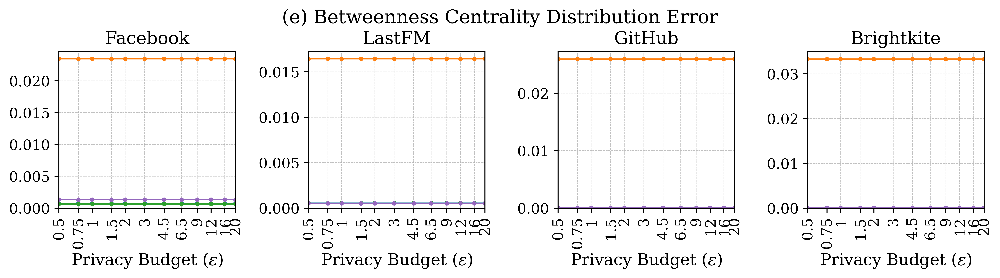

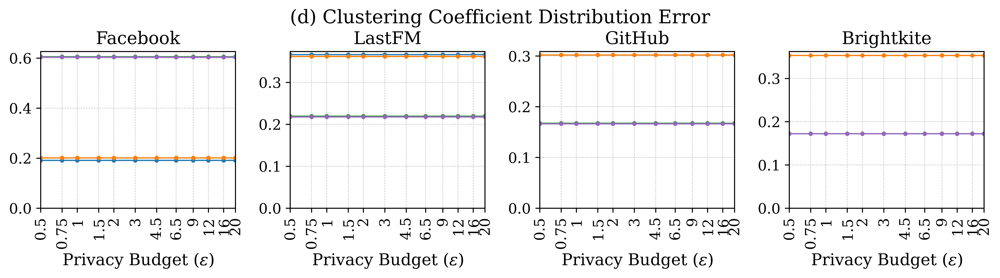

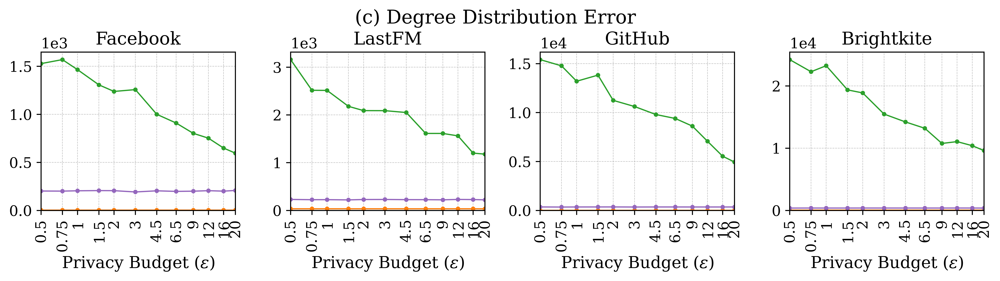

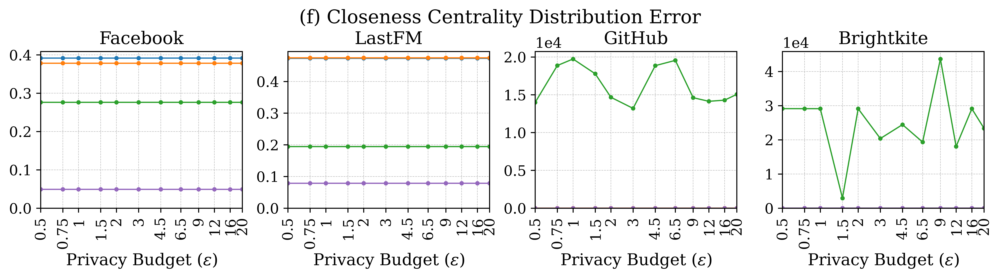

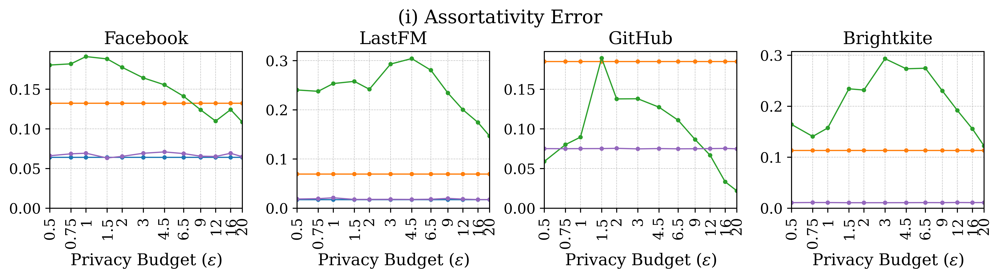

...

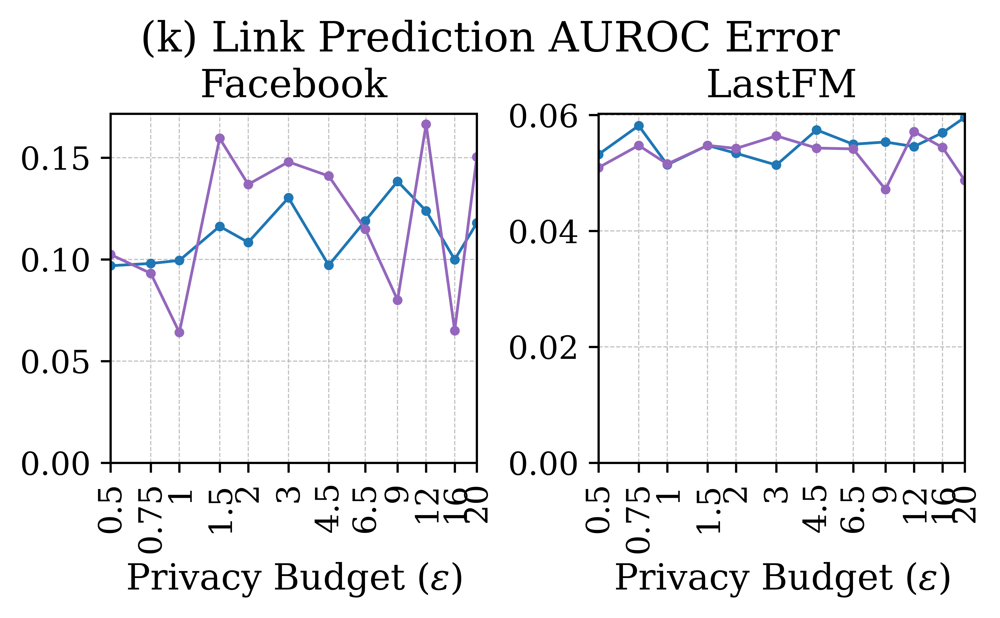

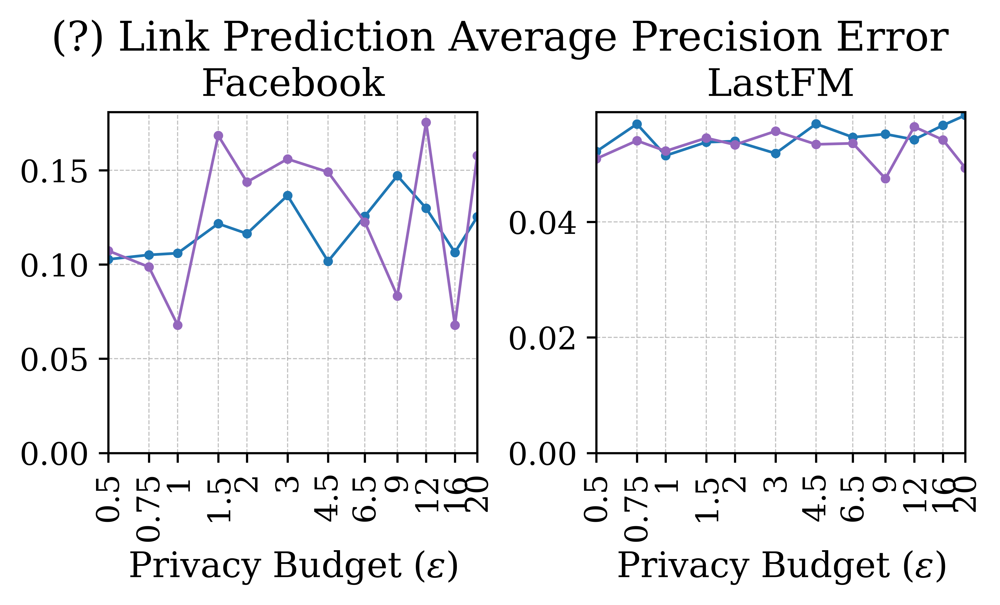

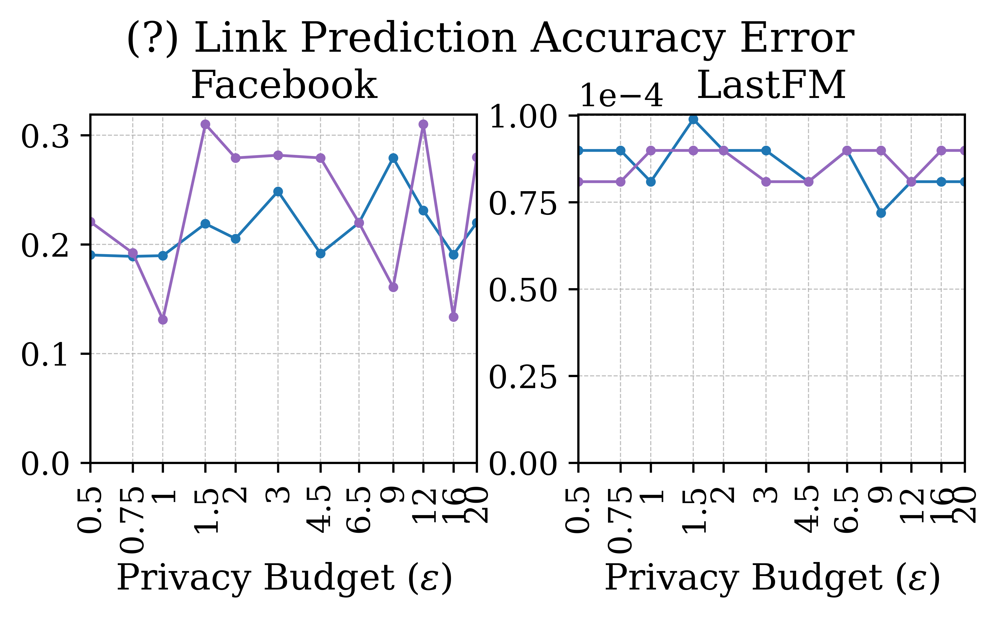

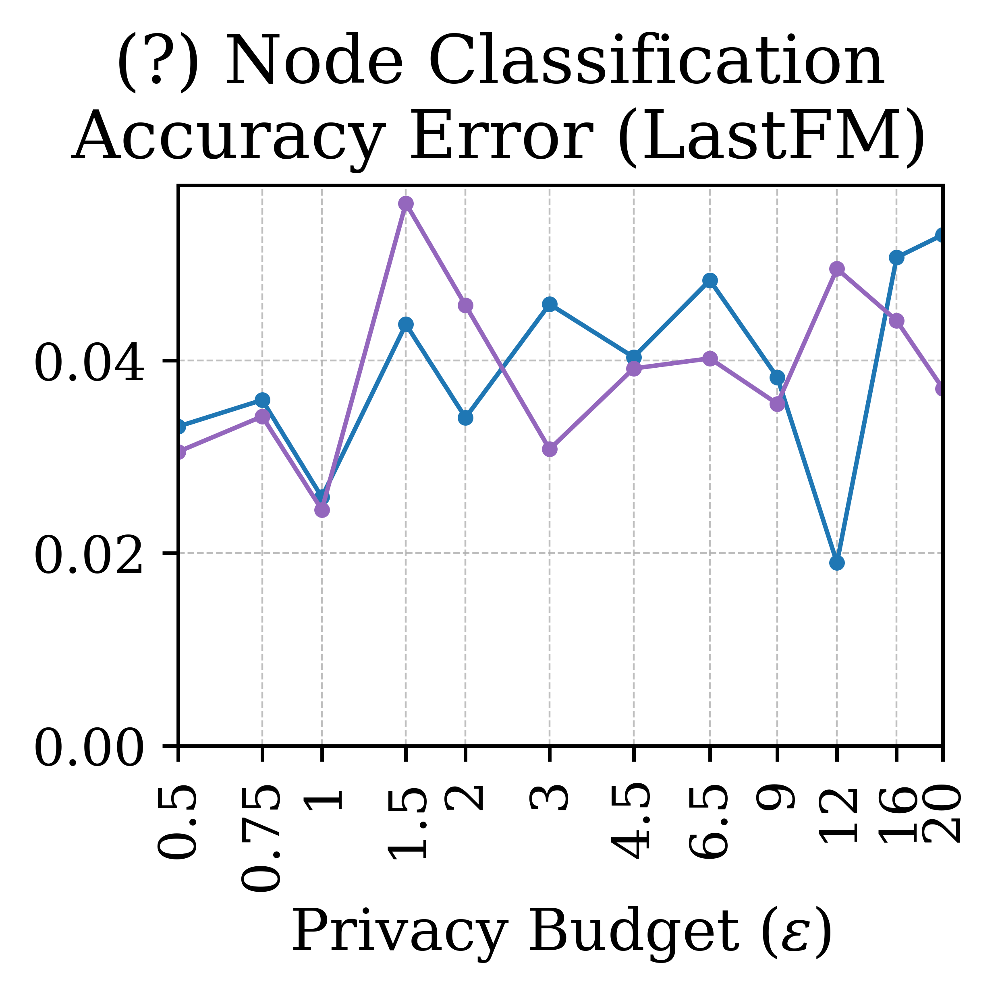

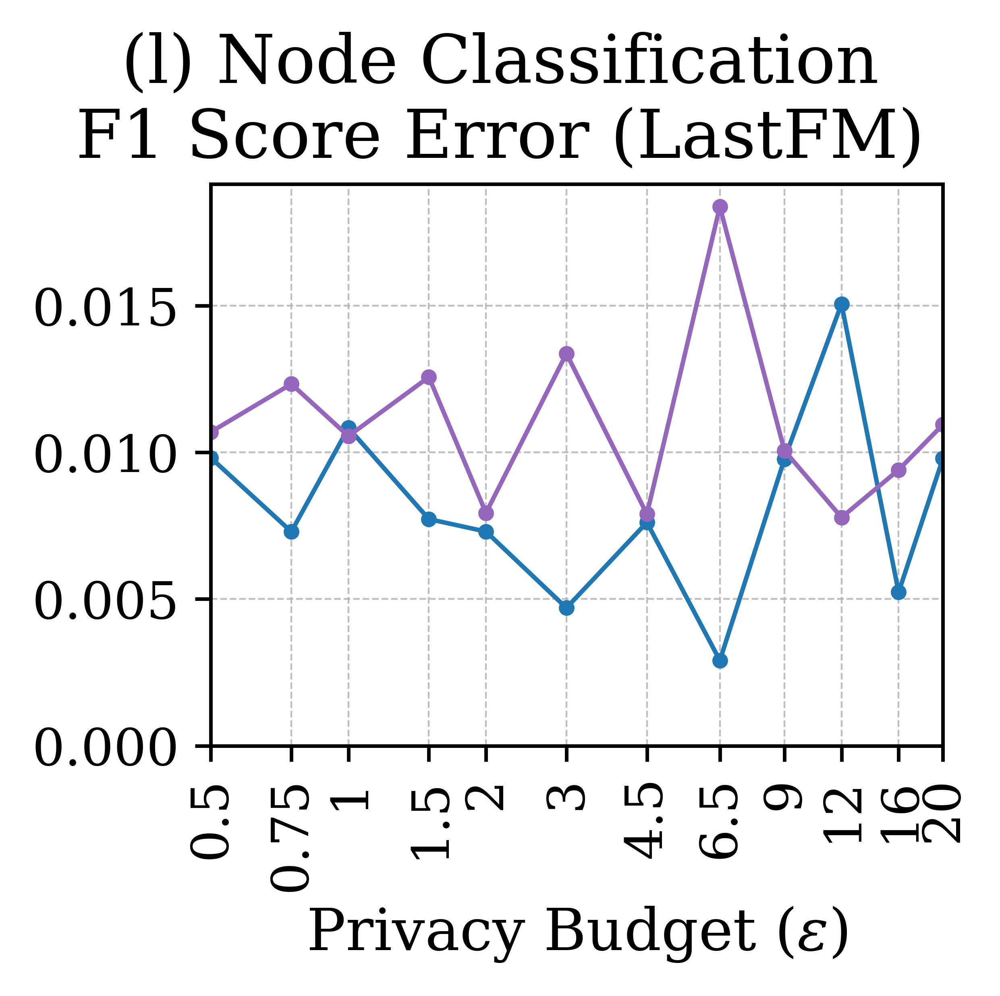

<Figure size 800x800 with 0 Axes>

In [5]:
plot_errors(datasets=["Facebook", "LastFM", "GitHub", "Brightkite"], with_label_ids=True)
#plot_ccdf_distributions(datasets=["Facebook", "LastFM", "GitHub", "Brightkite"])
#tabulate_and_plot_measurements(datasets=["Facebook", "LastFM", "GitHub", "Brightkite"])

In [ ]:
csvs = sorted(glob("./Results/*/csvs/*.csv"), key=os.path.getmtime)
for path in csvs:
    print(path)
    df = pd.read_csv(path)
    print(df)
    print()